In [1]:
#Set up code to exclude all warnings throughout the script
import warnings
warnings.filterwarnings("ignore")

# Feature extraction using TextDescriptives

In [2]:
#Make sure to have all the relevant packages installed in terminal:
#pip install <package name>

## Step 1: Load in my data

In [3]:
import textdescriptives as td
import spacy
import pandas as pd

#Load in data
df = pd.read_csv('csv files/data_for_ML.csv')

#Showing the df
df

,id,completion,type,source
0,0,"As you looked back on your journey, you realiz...",machine,your free trial of life has ended
1,0,Overpopulation'' The man in the blue suit clic...,human,your free trial of life has ended
2,1,"The once-heroic StableBeluga, now a powerful a...",machine,- you either die a hero. . .''
3,1,". . . . . . She was shaking, i was too, he was...",human,- you either die a hero. . .''
4,2,"As they sat down on a bench, they reminisced a...",machine,"just like old times, huh?''"
...,...,...,...,...
9995,4997,The first page came out of the press warm to t...,human,you're a publisher who happens upon an enchant...
9996,4998,"The first specimen, a human, was amazed at the...",machine,: two specimens of two completely random speci...
9997,4998,Ohmygodohmygodohmygodit's sooooo white in here...,human,: two specimens of two completely random speci...
9998,4999,"The training was intense and grueling, pushing...",machine,a rogue planet is going to destroy the earth i...


## Step 2: Doing feature extraction on my dataset

We will use a spacy model to extract features. So what is a Spacy model?

A spacy mdel is a specific model that uses a certain algoritm to identify entities (enheder) in a given text.
This means that one spacy model might only identify names and numbers in a text, some other model might identify more categories. 
Models can also hold different 'thresholds' for when a word/other is identified as something.
By telling the code to use some spacy model you are telling it how to label different words/tokens/etc. in a text

In [4]:
#For measuring time execution 
import time 
st = time.time()

#OBS: assumes you have downloaded the ´en_core_web_model´ (can be done in terminal):python3 -m spacy download en_core_web_sm
#Extract metrics
feature_df = td.extract_metrics(
    text=df["completion"], #Does feature extraction on this column
    spacy_model="en_core_web_sm", #Specifies which spacy model to be used
    metrics=None, #Gets all the features 
)

#Get the time execution 
sum_x = 0
for i in range(1000000):
    sum_x += i
time.sleep(3)
print('Sum:', sum_x)

elapsed_time = time.time() - st
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(elapsed_time)))

#Print the features
feature_df

Sum: 499999500000
Execution time: 00:12:49


,text,entropy,perplexity,per_word_perplexity,passed_quality_check,n_stop_words,alpha_ratio,mean_word_length,doc_length,symbol_to_word_ratio_#,...,coleman_liau_index,lix,rix,dependency_distance_mean,dependency_distance_std,prop_adjacent_dependency_relation_mean,prop_adjacent_dependency_relation_std,first_order_coherence,second_order_coherence,pos_prop_SPACE
0,"As you looked back on your journey, you realiz...",5.885228,3.596847e+02,2.234067,True,88.0,0.906832,4.031056,161.0,0.0,...,8.517260,42.826484,4.500000,2.945440,0.634596,0.437777,0.046247,0.545130,0.452335,NaN
1,Overpopulation'' The man in the blue suit clic...,18.645850,1.252534e+08,230669.282371,True,243.0,0.854512,3.819521,543.0,0.0,...,6.702919,27.534991,1.829268,2.146945,0.870906,0.467003,0.080434,0.396135,0.397780,NaN
2,"The once-heroic StableBeluga, now a powerful a...",11.601285,1.092381e+05,294.442326,True,207.0,0.902965,4.099730,371.0,0.0,...,8.762985,40.004390,4.000000,2.693559,0.325478,0.427590,0.058091,0.600038,0.558004,NaN
3,". . . . . . She was shaking, i was too, he was...",16.269964,1.164006e+07,27324.095845,True,237.0,0.838028,3.077465,426.0,0.0,...,1.752370,16.823869,0.676471,2.046305,0.797988,0.419688,0.072094,0.518784,0.445371,NaN
4,"As they sat down on a bench, they reminisced a...",6.138635,4.634206e+02,2.305575,True,108.0,0.895522,4.084577,201.0,0.0,...,8.925363,33.855369,2.777778,2.671367,0.308105,0.438967,0.073020,0.464232,0.403240,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,The first page came out of the press warm to t...,11.173607,7.122555e+04,208.872585,True,150.0,0.815249,3.586510,341.0,0.0,...,4.561208,18.323113,0.775000,1.829839,0.659055,0.450562,0.112471,0.385227,0.350834,NaN
9996,"The first specimen, a human, was amazed at the...",12.145022,1.881551e+05,578.938634,False,158.0,0.873846,4.335385,325.0,0.0,...,10.908410,39.948984,3.937500,2.654054,0.568548,0.469978,0.043758,0.545293,0.595401,NaN
9997,Ohmygodohmygodohmygodit's sooooo white in here...,13.601288,8.071689e+05,1859.836235,True,215.0,0.845622,3.453917,434.0,0.0,...,4.118867,21.133873,1.114286,2.233784,0.594526,0.416519,0.079957,0.366547,0.355985,NaN
9998,"The training was intense and grueling, pushing...",9.682911,1.604112e+04,54.192971,True,135.0,0.888514,4.594595,296.0,0.0,...,12.241985,43.039186,4.466667,2.620162,0.476786,0.451614,0.043322,0.491547,0.531125,NaN


In [5]:
#Get number of columns
len(feature_df. columns) 

71

In [6]:
#Check how many of each type (machine vs. human) the data contains
df["type"].value_counts()

type
machine    5000
human      5000
Name: count, dtype: int64

In [7]:
#Join the metrics to the original dataframe to get the type, id and source
metrics_df = df.join(feature_df.drop(columns=["text"]))
metrics_df

,id,completion,type,source,entropy,perplexity,per_word_perplexity,passed_quality_check,n_stop_words,alpha_ratio,...,coleman_liau_index,lix,rix,dependency_distance_mean,dependency_distance_std,prop_adjacent_dependency_relation_mean,prop_adjacent_dependency_relation_std,first_order_coherence,second_order_coherence,pos_prop_SPACE
0,0,"As you looked back on your journey, you realiz...",machine,your free trial of life has ended,5.885228,3.596847e+02,2.234067,True,88.0,0.906832,...,8.517260,42.826484,4.500000,2.945440,0.634596,0.437777,0.046247,0.545130,0.452335,NaN
1,0,Overpopulation'' The man in the blue suit clic...,human,your free trial of life has ended,18.645850,1.252534e+08,230669.282371,True,243.0,0.854512,...,6.702919,27.534991,1.829268,2.146945,0.870906,0.467003,0.080434,0.396135,0.397780,NaN
2,1,"The once-heroic StableBeluga, now a powerful a...",machine,- you either die a hero. . .'',11.601285,1.092381e+05,294.442326,True,207.0,0.902965,...,8.762985,40.004390,4.000000,2.693559,0.325478,0.427590,0.058091,0.600038,0.558004,NaN
3,1,". . . . . . She was shaking, i was too, he was...",human,- you either die a hero. . .'',16.269964,1.164006e+07,27324.095845,True,237.0,0.838028,...,1.752370,16.823869,0.676471,2.046305,0.797988,0.419688,0.072094,0.518784,0.445371,NaN
4,2,"As they sat down on a bench, they reminisced a...",machine,"just like old times, huh?''",6.138635,4.634206e+02,2.305575,True,108.0,0.895522,...,8.925363,33.855369,2.777778,2.671367,0.308105,0.438967,0.073020,0.464232,0.403240,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,4997,The first page came out of the press warm to t...,human,you're a publisher who happens upon an enchant...,11.173607,7.122555e+04,208.872585,True,150.0,0.815249,...,4.561208,18.323113,0.775000,1.829839,0.659055,0.450562,0.112471,0.385227,0.350834,NaN
9996,4998,"The first specimen, a human, was amazed at the...",machine,: two specimens of two completely random speci...,12.145022,1.881551e+05,578.938634,False,158.0,0.873846,...,10.908410,39.948984,3.937500,2.654054,0.568548,0.469978,0.043758,0.545293,0.595401,NaN
9997,4998,Ohmygodohmygodohmygodit's sooooo white in here...,human,: two specimens of two completely random speci...,13.601288,8.071689e+05,1859.836235,True,215.0,0.845622,...,4.118867,21.133873,1.114286,2.233784,0.594526,0.416519,0.079957,0.366547,0.355985,NaN
9998,4999,"The training was intense and grueling, pushing...",machine,a rogue planet is going to destroy the earth i...,9.682911,1.604112e+04,54.192971,True,135.0,0.888514,...,12.241985,43.039186,4.466667,2.620162,0.476786,0.451614,0.043322,0.491547,0.531125,NaN


In [8]:
#Check to se that it added 3 more columns
len(metrics_df. columns) 

74

## Step 3: Visualization of the features

<Axes: xlabel='type', ylabel='coleman_liau_index'>

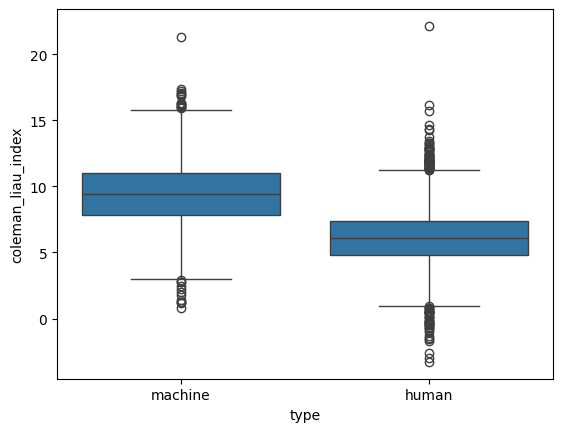

In [9]:
import seaborn as sns
sns.boxplot(x="type", y="coleman_liau_index", data=metrics_df) #Insert any metric you want plotted

## Step 4: Correlation test 

In [10]:
#Encodes the type as a boolean: makes a column in metrics_df 'is_human' that is either true or false
metrics_df["is_human"] = metrics_df["type"] == "human"
metrics_df

,id,completion,type,source,entropy,perplexity,per_word_perplexity,passed_quality_check,n_stop_words,alpha_ratio,...,lix,rix,dependency_distance_mean,dependency_distance_std,prop_adjacent_dependency_relation_mean,prop_adjacent_dependency_relation_std,first_order_coherence,second_order_coherence,pos_prop_SPACE,is_human
0,0,"As you looked back on your journey, you realiz...",machine,your free trial of life has ended,5.885228,3.596847e+02,2.234067,True,88.0,0.906832,...,42.826484,4.500000,2.945440,0.634596,0.437777,0.046247,0.545130,0.452335,NaN,False
1,0,Overpopulation'' The man in the blue suit clic...,human,your free trial of life has ended,18.645850,1.252534e+08,230669.282371,True,243.0,0.854512,...,27.534991,1.829268,2.146945,0.870906,0.467003,0.080434,0.396135,0.397780,NaN,True
2,1,"The once-heroic StableBeluga, now a powerful a...",machine,- you either die a hero. . .'',11.601285,1.092381e+05,294.442326,True,207.0,0.902965,...,40.004390,4.000000,2.693559,0.325478,0.427590,0.058091,0.600038,0.558004,NaN,False
3,1,". . . . . . She was shaking, i was too, he was...",human,- you either die a hero. . .'',16.269964,1.164006e+07,27324.095845,True,237.0,0.838028,...,16.823869,0.676471,2.046305,0.797988,0.419688,0.072094,0.518784,0.445371,NaN,True
4,2,"As they sat down on a bench, they reminisced a...",machine,"just like old times, huh?''",6.138635,4.634206e+02,2.305575,True,108.0,0.895522,...,33.855369,2.777778,2.671367,0.308105,0.438967,0.073020,0.464232,0.403240,NaN,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,4997,The first page came out of the press warm to t...,human,you're a publisher who happens upon an enchant...,11.173607,7.122555e+04,208.872585,True,150.0,0.815249,...,18.323113,0.775000,1.829839,0.659055,0.450562,0.112471,0.385227,0.350834,NaN,True
9996,4998,"The first specimen, a human, was amazed at the...",machine,: two specimens of two completely random speci...,12.145022,1.881551e+05,578.938634,False,158.0,0.873846,...,39.948984,3.937500,2.654054,0.568548,0.469978,0.043758,0.545293,0.595401,NaN,False
9997,4998,Ohmygodohmygodohmygodit's sooooo white in here...,human,: two specimens of two completely random speci...,13.601288,8.071689e+05,1859.836235,True,215.0,0.845622,...,21.133873,1.114286,2.233784,0.594526,0.416519,0.079957,0.366547,0.355985,NaN,True
9998,4999,"The training was intense and grueling, pushing...",machine,a rogue planet is going to destroy the earth i...,9.682911,1.604112e+04,54.192971,True,135.0,0.888514,...,43.039186,4.466667,2.620162,0.476786,0.451614,0.043322,0.491547,0.531125,NaN,False


In [11]:
#Make a new dataset that removes text column 
#This is done because it wont do correlation with a df with string(s) (which text is) in it
new_df = feature_df.drop(['text'], axis=1)
new_df

,entropy,perplexity,per_word_perplexity,passed_quality_check,n_stop_words,alpha_ratio,mean_word_length,doc_length,symbol_to_word_ratio_#,proportion_ellipsis,...,coleman_liau_index,lix,rix,dependency_distance_mean,dependency_distance_std,prop_adjacent_dependency_relation_mean,prop_adjacent_dependency_relation_std,first_order_coherence,second_order_coherence,pos_prop_SPACE
0,5.885228,3.596847e+02,2.234067,True,88.0,0.906832,4.031056,161.0,0.0,0.0,...,8.517260,42.826484,4.500000,2.945440,0.634596,0.437777,0.046247,0.545130,0.452335,NaN
1,18.645850,1.252534e+08,230669.282371,True,243.0,0.854512,3.819521,543.0,0.0,0.0,...,6.702919,27.534991,1.829268,2.146945,0.870906,0.467003,0.080434,0.396135,0.397780,NaN
2,11.601285,1.092381e+05,294.442326,True,207.0,0.902965,4.099730,371.0,0.0,0.0,...,8.762985,40.004390,4.000000,2.693559,0.325478,0.427590,0.058091,0.600038,0.558004,NaN
3,16.269964,1.164006e+07,27324.095845,True,237.0,0.838028,3.077465,426.0,0.0,0.0,...,1.752370,16.823869,0.676471,2.046305,0.797988,0.419688,0.072094,0.518784,0.445371,NaN
4,6.138635,4.634206e+02,2.305575,True,108.0,0.895522,4.084577,201.0,0.0,0.0,...,8.925363,33.855369,2.777778,2.671367,0.308105,0.438967,0.073020,0.464232,0.403240,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,11.173607,7.122555e+04,208.872585,True,150.0,0.815249,3.586510,341.0,0.0,0.0,...,4.561208,18.323113,0.775000,1.829839,0.659055,0.450562,0.112471,0.385227,0.350834,NaN
9996,12.145022,1.881551e+05,578.938634,False,158.0,0.873846,4.335385,325.0,0.0,0.0,...,10.908410,39.948984,3.937500,2.654054,0.568548,0.469978,0.043758,0.545293,0.595401,NaN
9997,13.601288,8.071689e+05,1859.836235,True,215.0,0.845622,3.453917,434.0,0.0,0.0,...,4.118867,21.133873,1.114286,2.233784,0.594526,0.416519,0.079957,0.366547,0.355985,NaN
9998,9.682911,1.604112e+04,54.192971,True,135.0,0.888514,4.594595,296.0,0.0,0.0,...,12.241985,43.039186,4.466667,2.620162,0.476786,0.451614,0.043322,0.491547,0.531125,NaN


In [12]:
#Correlates all the metrics in new_df with the label 'is human'
metrics_correlations = new_df.corrwith(metrics_df["is_human"]).sort_values(
    key=abs, ascending=False
)

#Prints the top 10 most correlated (Can be either positive or negative)
metrics_correlations[:10]

#CCONJ: A coordinating conjunction: Koordinerende konjunktioner forbinder to eller flere ord, sætninger, sætninger eller sætninger af samme betydning.

second_order_coherence                  -0.690030
first_order_coherence                   -0.628846
smog                                    -0.624915
prop_adjacent_dependency_relation_std    0.618663
pos_prop_CCONJ                          -0.617543
coleman_liau_index                      -0.592997
pos_prop_SPACE                          -0.588973
mean_word_length                        -0.548570
flesch_reading_ease                      0.532825
n_sentences                              0.528986
dtype: float64

These correlation can be used to decide what metrics to include in the dataframe that goes into the ML pipiline if one wanted to only include some features

### Plotting some correlations

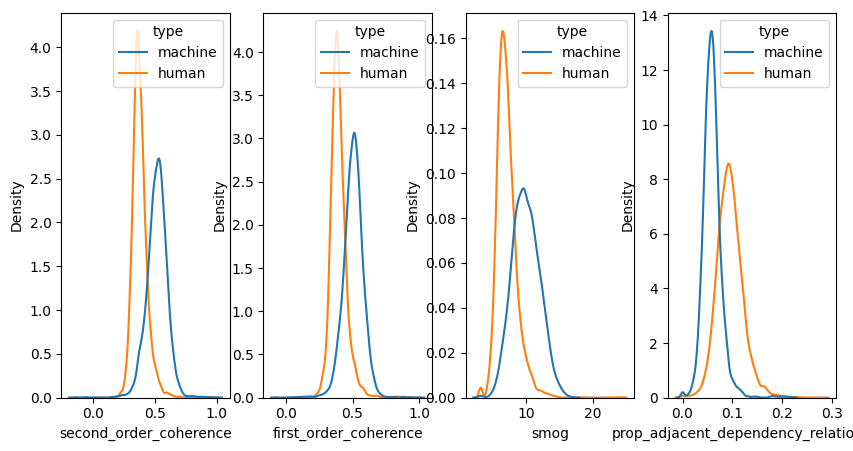

In [13]:
#Plot a kernel density estimate (KDE) plot for the top 4 metrics
import matplotlib.pyplot as plt

#Change number of plots to e.g 6 by putting 6 where 4 stands
fig, ax = plt.subplots(1, 4, figsize=(10, 5), sharey=False)
for i, metric in enumerate(metrics_correlations.index[:4]):
    sns.kdeplot(metrics_df, x=metric, hue="type", ax=ax[i])

#Meaning that a positive correlation makes it likely to be human and vice versa 

# Doing ML using Extreme Gradient Boosting 

In [14]:
# Make sure to have all the relevant packages installed in terminal:
# pip install <package name>

## Step 1: Import and inspect data 

In [15]:
import pandas as pd 
import numpy as np

#Load in data
#Here i am just using the metrics_df from earlier 
ML_data = metrics_df

#See data
ML_data

,id,completion,type,source,entropy,perplexity,per_word_perplexity,passed_quality_check,n_stop_words,alpha_ratio,...,lix,rix,dependency_distance_mean,dependency_distance_std,prop_adjacent_dependency_relation_mean,prop_adjacent_dependency_relation_std,first_order_coherence,second_order_coherence,pos_prop_SPACE,is_human
0,0,"As you looked back on your journey, you realiz...",machine,your free trial of life has ended,5.885228,3.596847e+02,2.234067,True,88.0,0.906832,...,42.826484,4.500000,2.945440,0.634596,0.437777,0.046247,0.545130,0.452335,NaN,False
1,0,Overpopulation'' The man in the blue suit clic...,human,your free trial of life has ended,18.645850,1.252534e+08,230669.282371,True,243.0,0.854512,...,27.534991,1.829268,2.146945,0.870906,0.467003,0.080434,0.396135,0.397780,NaN,True
2,1,"The once-heroic StableBeluga, now a powerful a...",machine,- you either die a hero. . .'',11.601285,1.092381e+05,294.442326,True,207.0,0.902965,...,40.004390,4.000000,2.693559,0.325478,0.427590,0.058091,0.600038,0.558004,NaN,False
3,1,". . . . . . She was shaking, i was too, he was...",human,- you either die a hero. . .'',16.269964,1.164006e+07,27324.095845,True,237.0,0.838028,...,16.823869,0.676471,2.046305,0.797988,0.419688,0.072094,0.518784,0.445371,NaN,True
4,2,"As they sat down on a bench, they reminisced a...",machine,"just like old times, huh?''",6.138635,4.634206e+02,2.305575,True,108.0,0.895522,...,33.855369,2.777778,2.671367,0.308105,0.438967,0.073020,0.464232,0.403240,NaN,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,4997,The first page came out of the press warm to t...,human,you're a publisher who happens upon an enchant...,11.173607,7.122555e+04,208.872585,True,150.0,0.815249,...,18.323113,0.775000,1.829839,0.659055,0.450562,0.112471,0.385227,0.350834,NaN,True
9996,4998,"The first specimen, a human, was amazed at the...",machine,: two specimens of two completely random speci...,12.145022,1.881551e+05,578.938634,False,158.0,0.873846,...,39.948984,3.937500,2.654054,0.568548,0.469978,0.043758,0.545293,0.595401,NaN,False
9997,4998,Ohmygodohmygodohmygodit's sooooo white in here...,human,: two specimens of two completely random speci...,13.601288,8.071689e+05,1859.836235,True,215.0,0.845622,...,21.133873,1.114286,2.233784,0.594526,0.416519,0.079957,0.366547,0.355985,NaN,True
9998,4999,"The training was intense and grueling, pushing...",machine,a rogue planet is going to destroy the earth i...,9.682911,1.604112e+04,54.192971,True,135.0,0.888514,...,43.039186,4.466667,2.620162,0.476786,0.451614,0.043322,0.491547,0.531125,NaN,False


In [16]:
#Get different statistics of the data 
ML_data.describe()

,id,entropy,perplexity,per_word_perplexity,n_stop_words,alpha_ratio,mean_word_length,doc_length,symbol_to_word_ratio_#,proportion_ellipsis,...,coleman_liau_index,lix,rix,dependency_distance_mean,dependency_distance_std,prop_adjacent_dependency_relation_mean,prop_adjacent_dependency_relation_std,first_order_coherence,second_order_coherence,pos_prop_SPACE
count,10000.000000,10000.000000,1.000000e+04,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,...,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,9980.000000,9947.000000,140.000000
mean,2499.500000,13.070567,5.231107e+15,5.841505e+12,190.345300,0.862928,3.928641,389.420400,0.000074,0.001000,...,7.791430,33.782590,2.979576,2.519737,0.656277,0.432410,0.077161,0.450321,0.447532,0.014555
std,1443.447818,6.815418,4.827420e+17,5.432897e+14,101.338651,0.046619,0.395338,204.655045,0.001494,0.031609,...,2.773370,12.137680,2.418249,0.394337,0.472614,0.027953,0.028624,0.087293,0.099911,0.011880
min,0.000000,0.408876,1.505125e+00,4.674302e-03,0.000000,0.374332,2.227769,13.000000,0.000000,0.000000,...,-3.285806,7.948718,0.000000,1.106038,0.000000,0.176471,0.000000,-0.071074,-0.148933,0.001130
25%,1249.750000,8.026143,3.059915e+03,1.293224e+01,116.000000,0.839411,3.637920,237.000000,0.000000,0.000000,...,5.775274,26.005129,1.611111,2.270478,0.433623,0.416209,0.056441,0.383395,0.366725,0.005110
50%,2499.500000,11.359219,8.575242e+04,2.607228e+02,164.000000,0.875000,3.885616,333.000000,0.000000,0.000000,...,7.587839,32.775158,2.600000,2.569187,0.600878,0.433012,0.072608,0.442038,0.434779,0.013423
75%,3749.250000,16.733513,1.850435e+07,3.766154e+04,242.000000,0.895062,4.198913,502.000000,0.000000,0.000000,...,9.707071,40.334238,4.000000,2.756637,0.800661,0.450142,0.095133,0.513511,0.524548,0.019231
max,4999.000000,45.320726,4.814389e+19,5.421609e+16,661.000000,1.000000,6.267296,1014.000000,0.071856,1.000000,...,22.151278,599.010050,161.000000,11.973913,17.611543,0.538462,0.278769,0.998637,0.998486,0.076923


In [17]:
#Dummy-coding the 'target' varible (here: type) into 0 (for machine) and 1 (for human)
ML_data['type']= ML_data['type'].replace({'human':1, 'machine':0})
ML_data.head()

,id,completion,type,source,entropy,perplexity,per_word_perplexity,passed_quality_check,n_stop_words,alpha_ratio,...,lix,rix,dependency_distance_mean,dependency_distance_std,prop_adjacent_dependency_relation_mean,prop_adjacent_dependency_relation_std,first_order_coherence,second_order_coherence,pos_prop_SPACE,is_human
0,0,"As you looked back on your journey, you realiz...",0,your free trial of life has ended,5.885228,3.596847e+02,2.234067,True,88.0,0.906832,...,42.826484,4.500000,2.945440,0.634596,0.437777,0.046247,0.545130,0.452335,NaN,False
1,0,Overpopulation'' The man in the blue suit clic...,1,your free trial of life has ended,18.645850,1.252534e+08,230669.282371,True,243.0,0.854512,...,27.534991,1.829268,2.146945,0.870906,0.467003,0.080434,0.396135,0.397780,NaN,True
2,1,"The once-heroic StableBeluga, now a powerful a...",0,- you either die a hero. . .'',11.601285,1.092381e+05,294.442326,True,207.0,0.902965,...,40.004390,4.000000,2.693559,0.325478,0.427590,0.058091,0.600038,0.558004,NaN,False
3,1,". . . . . . She was shaking, i was too, he was...",1,- you either die a hero. . .'',16.269964,1.164006e+07,27324.095845,True,237.0,0.838028,...,16.823869,0.676471,2.046305,0.797988,0.419688,0.072094,0.518784,0.445371,NaN,True
4,2,"As they sat down on a bench, they reminisced a...",0,"just like old times, huh?''",6.138635,4.634206e+02,2.305575,True,108.0,0.895522,...,33.855369,2.777778,2.671367,0.308105,0.438967,0.073020,0.464232,0.403240,NaN,False


In [18]:
#Get the data type and how many missing values (NA's) exist in each column 
import pandas as pd
ML_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 75 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   id                                      10000 non-null  int64  
 1   completion                              10000 non-null  object 
 2   type                                    10000 non-null  int64  
 3   source                                  10000 non-null  object 
 4   entropy                                 10000 non-null  float64
 5   perplexity                              10000 non-null  float64
 6   per_word_perplexity                     10000 non-null  float64
 7   passed_quality_check                    10000 non-null  bool   
 8   n_stop_words                            10000 non-null  float64
 9   alpha_ratio                             10000 non-null  float64
 10  mean_word_length                        10000 non-null  flo

In [19]:
#Drop object columns 
ML_data= ML_data.drop(columns='oov_ratio')
#oov_ratio as the only 'object' predictor is going to give us troubles later on (explanier wont take object classes) if we dont remove it
#It contains nothing/Na's at the moment (at least for the 200-completion test data set)
#It is therefore removed

## Step 2: Split the data into training and test 

In [20]:
from sklearn.model_selection import train_test_split

#Seperate the features from the target
X= ML_data.drop(columns= ['type','completion','id','source', 'is_human']) #Takes all the columns expect these to be predictors 
y= ML_data['type'] #Takes only the column 'type' to be the target (the thing we predict)

#Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=8)
#Uses 20% for test
#Does stratify the sampling
#Sets random seed so we get reproducable results         

In [21]:
# See all the predictors in the train data
X_train

#There are 69 columns which are all of the extracted features 

,entropy,perplexity,per_word_perplexity,passed_quality_check,n_stop_words,alpha_ratio,mean_word_length,doc_length,symbol_to_word_ratio_#,proportion_ellipsis,...,coleman_liau_index,lix,rix,dependency_distance_mean,dependency_distance_std,prop_adjacent_dependency_relation_mean,prop_adjacent_dependency_relation_std,first_order_coherence,second_order_coherence,pos_prop_SPACE
9474,12.587029,2.927367e+05,8.436216e+02,True,187.0,0.893372,3.939481,347.0,0.0,0.0,...,8.014757,37.428479,3.466667,2.894507,0.507881,0.446445,0.041108,0.509847,0.525059,NaN
72,7.545994,1.893143e+03,8.339838e+00,True,106.0,0.885463,4.352423,227.0,0.0,0.0,...,10.796000,42.181818,4.363636,2.467429,0.289257,0.481734,0.069207,0.486257,0.522310,NaN
9420,5.920015,3.724175e+02,2.230045e+00,True,87.0,0.892216,4.155689,167.0,0.0,0.0,...,9.655448,38.125000,3.625000,2.437354,0.602550,0.478116,0.048995,0.492141,0.469732,NaN
4989,27.342835,7.496221e+11,8.850320e+08,True,385.0,0.826446,3.687131,847.0,0.0,0.0,...,6.025556,25.505942,1.596774,2.182553,1.040659,0.435591,0.133618,0.335054,0.340590,NaN
3486,12.981993,4.345181e+05,1.122786e+03,True,195.0,0.901809,4.038760,387.0,0.0,0.0,...,8.525896,40.295138,4.058824,2.668257,0.426160,0.452776,0.070304,0.492475,0.492178,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6995,9.270918,1.062450e+04,3.449512e+01,True,180.0,0.912338,3.766234,308.0,0.0,0.0,...,6.538932,31.579797,2.153846,2.588043,0.589536,0.442459,0.046683,0.469304,0.495045,NaN
2181,9.703672,1.637764e+04,6.447890e+01,True,134.0,0.846457,3.539370,254.0,0.0,0.0,...,1.802000,16.763158,0.605263,1.593305,0.719844,0.425866,0.115441,0.338489,0.361500,NaN
2033,6.258001,5.221743e+02,2.341589e+00,True,100.0,0.860987,3.793722,223.0,0.0,0.0,...,6.831489,32.687943,2.666667,2.185716,1.057888,0.396229,0.137295,0.391464,0.271059,NaN
9556,9.423695,1.237824e+04,5.757319e+01,True,120.0,0.906977,3.962791,215.0,0.0,0.0,...,7.618256,36.701632,3.363636,2.664723,0.608187,0.507961,0.081974,0.616096,0.597762,NaN


## Step 3: Hyperparameter tuning 


Tuning the hyperparameters can ''profoundly influence a model's performance.''. There are different ways of doing so like grid search, random search and Bayesian optimization/automated hyperparameter tuning. Here we will do Bayesian optimization using the BayesSearchCV function. Check this link for more information: https://scikit-optimize.github.io/stable/modules/generated/skopt.BayesSearchCV.html. The idea is that it uses a search space to look for and choose the best hyperparameters based on their cross-validation performance

In [22]:
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from xgboost import XGBClassifier

#Define the search space of different selected hyperparameter values 
#Integer and Real refers to the type and whats inside () refers to the space
#Integer means it must be an integer between example 2 and 8
#Real refers to numbers that have a decimal point, as opposed to integers
search_space = {
    'clf__max_depth': Integer(3,10), #Tree booster #Kaggle source
    'clf__learning_rate': Real(0.01,2.0, prior= 'log-uniform'), #Tree booster #Kaggle source
    'clf__subsample': Real(0.5,1.0), #Tree booster #Analytics Vidhya sorurce
    'clf__colsample_bytree': Real(0.5,1.0), #Tree booster #Analytics Vidhya sorurce
    'clf__colsample_bylevel': Real(0.5,1.0), #Tree booster
    'clf__colsample_bynode': Real(0.5,1.0), #Tree booster
    'clf__reg_alpha': Real(0.0,10.0), #Tree booster
    'clf__reg_lambda': Real(0.0,10.0), #Tree booster
    'clf__gamma':Real(0.0,10.0) #Tree booster
}

# Only the hyperparameters listed above will be considered for tuning (I.e. there are more than these)
#The full list and their definition can be found here: https://xgboost.readthedocs.io/en/stable/python/python_api.html#xgboost.XGBClassifier


# Set up an varible 'opt' for optimazation 
#BayesSearchCV implements a “fit” and a “score” method. 
opt= BayesSearchCV(XGBClassifier(), search_space, cv= 3, n_iter= 100, scoring = 'accuracy', random_state=8)
#cv: the number of cross validation folds, default is 3
#n_iter: number of iterrations, default is 50 
#Scoring: the metric used for model evaluation, see full list: https://scikit-learn.org/stable/modules/model_evaluation.html

## Step 4: Training the XGboost model


In [23]:
#This is needed because the newer version of numpy package causes some fitting issues: see this link:
#https://github.com/WongKinYiu/yolov7/issues/1280
import numpy as np
np.int = np.int_
#''numpy.int (along with other similar types) was deprecated in NumPy 1.20 and subsequently removed in NumPy 1.24. Therefore, using numpy.int in versions after 1.24 will raise an error.'' 

#For getting the time execution
st = time.time()

#Fitting the model
opt.fit(X_train, y_train)

#Get the time execution 
sum_x = 0
for i in range(1000000):
    sum_x += i
time.sleep(3)
print('Sum:', sum_x)

elapsed_time = time.time() - st
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(elapsed_time)))

Sum: 499999500000
Execution time: 00:05:17


## Step 5: Evalutate model and make predictions

In [24]:
xgboost_model = opt.best_estimator_

In [25]:
# make predictions on test data
y_pred = xgboost_model.predict(X_test)

In [26]:
#Compute and print whatever evalutation score we want
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
#https://scikit-learn.org/stable/modules/model_evaluation.html (full list)

print('XGBoost model accuracy score: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
print('XGBoost model recall score: {0:0.4f}'. format(recall_score(y_test, y_pred)))
print('XGBoost model precision score: {0:0.4f}'. format(precision_score(y_test, y_pred)))
print('XGBoost model f1 score: {0:0.4f}'. format(f1_score(y_test, y_pred)))

XGBoost model accuracy score: 0.9840
XGBoost model recall score: 0.9889
XGBoost model precision score: 0.9790
XGBoost model f1 score: 0.9839


In [27]:
#Acess the best estimater 
opt.best_estimator_

#In the 'XGBClassifier, we can see the best hyperparameters that are chosen, 
#Note that the hyperparameters we didnt specify in search_space is =None

XGBClassifier(base_score=None, booster=None, callbacks=None,
              clf__colsample_bylevel=0.5331080642783614,
              clf__colsample_bynode=0.7262320733948379,
              clf__colsample_bytree=0.5362052518135637,
              clf__gamma=7.436578137661654,
              clf__learning_rate=0.010760627075800262, clf__max_depth=7,
              clf__reg_alpha=5.016505750780453,
              clf__reg_lambda=1.964788283871643,
              clf__subsample=...level=None,
              colsample_bynode=None, colsample_bytree=None, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, ...)

In [28]:
#Acess the score chosen score: 'acuracy' for the best model (traning set)
opt.best_score_

0.9827499994608702

In [29]:
#Get the score ('acuracy') for the test set
opt.score(X_test, y_test)

0.984

In [30]:
#We can predict the type (human vs machine) on the test set
opt.predict(X_test)

array([1, 1, 1, ..., 0, 0, 0])

In [31]:
#Similarly, the probabilities for each prediction
opt.predict_proba(X_test)

array([[7.9870224e-06, 9.9999201e-01],
       [9.5725060e-05, 9.9990427e-01],
       [3.9458275e-05, 9.9996054e-01],
       ...,
       [9.9498749e-01, 5.0125238e-03],
       [9.9999517e-01, 4.8416750e-06],
       [9.5433038e-01, 4.5669589e-02]], dtype=float32)

## Step 6: Feature importance

<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

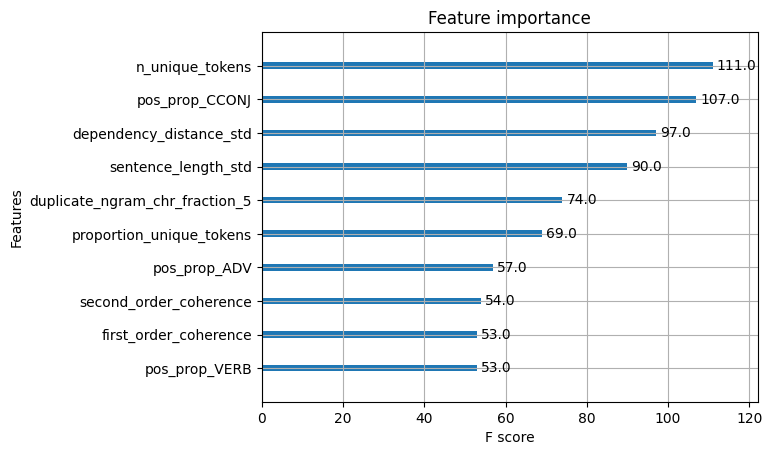

In [32]:
from xgboost import plot_importance

plot_importance(xgboost_model, max_num_features=10, importance_type='weight')

#importance_type='weight' (default) = the number of times a feature appears in a tree
#see: https://xgboost.readthedocs.io/en/stable/python/python_api.html (plotting API section)

### Plot shap values 

In [33]:
import shap
shap.initjs() # load JS visualization code to notebook

#Setting up SHAP Explainer
explainer = shap.TreeExplainer(xgboost_model)
shap_values = explainer.shap_values(X_test) #Should i write X_test or X here?


In [34]:
shap_values

array([[-0.0351991 ,  0.        , -0.2823589 , ...,  0.22337638,
         0.4837067 ,  0.02440087],
       [ 0.01760099,  0.        , -0.10524463, ...,  0.14803407,
         0.77399266,  0.02373725],
       [ 0.03048772,  0.        ,  0.66070217, ...,  0.1512045 ,
         0.64558923,  0.02433177],
       ...,
       [ 0.11403827,  0.        ,  0.3030565 , ..., -0.10437799,
        -1.0642709 ,  0.00493455],
       [-0.01031775,  0.        , -0.55334455, ...,  0.02617429,
        -0.94369763,  0.00286235],
       [-0.01583782,  0.        , -0.42985252, ..., -0.08604523,
         0.32162502,  0.01422104]], dtype=float32)

In [35]:
len(shap_values) 

2000

We can take the mean absolute value of the SHAP values for each feature to get a standard bar plot (produces stacked bars for multi-class outputs):

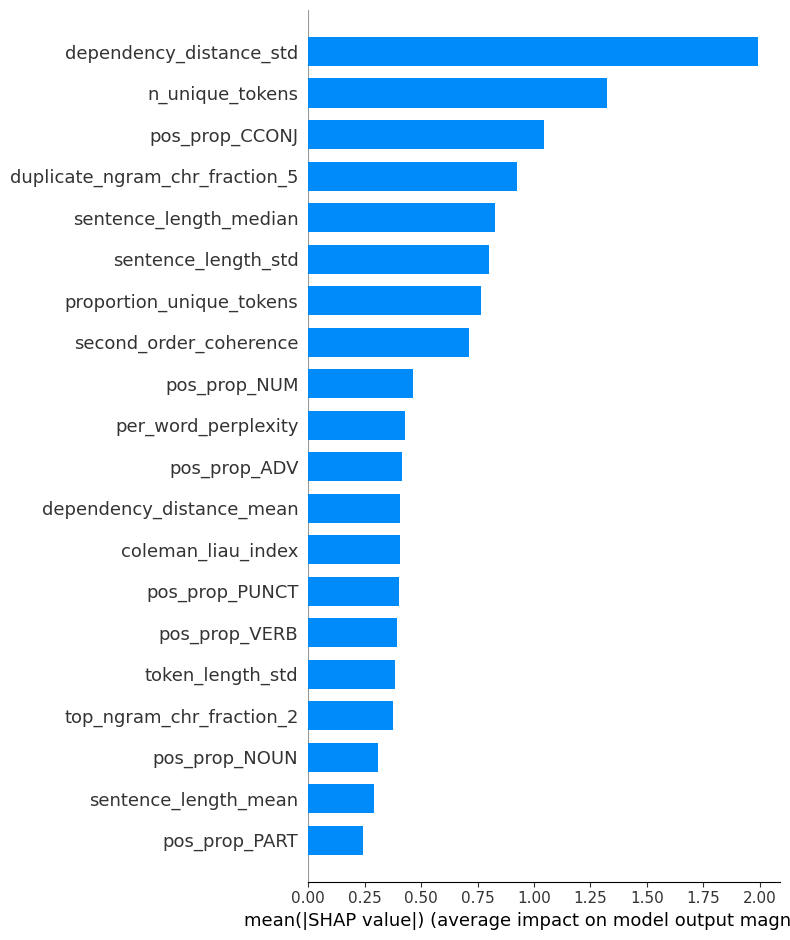

In [36]:
#Mean Shap Values
shap.summary_plot(shap_values, X_test,plot_type="bar")

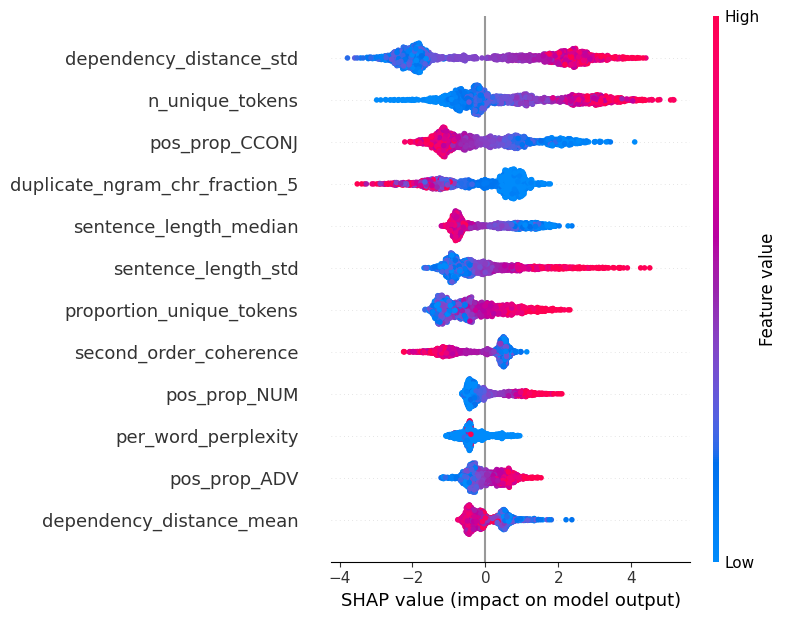

In [37]:
#Shap plot 
shap.summary_plot(shap_values, X_test,max_display=12)


Y-axis indicates the feature names (the predictors) in order of importance from top to bottom. The color of each row represents the value of the corresponding feature, with red indicating high values and blue indicating low values. 
X-axis represents the SHAP value, which indicates the degree of change in log odds of predictions.
A positive shap value indicates an increase in the probability of predicting 1 (human), a negative shap value indicates an increase in the probability of predicting 0 (machine). Looking at this plot we can e.g. conclude that
1) a text with a high value of dependency_distance_std is more likely to be classified as human (and vice versa)
2) a  text with a high value of n_unique_tokens is more likely to be classified as human (and vice versa)
3) a text with a low value of pos_prop_cconj is more likely to be classified as human (and vice versa)

etc. etc.

Generally, we see quite distinct patterns with high/low values obviously seperated, which is good and indicates consistent patterns in the data as well. 

In [38]:
#Force plot
shap.force_plot(explainer.expected_value, shap_values, X_test)

#here we can compare features to each other

# Explore model that uses only most important features as predictors

## Model using 3 most important features

In [39]:
#Define new predictors and target
X_model1= ML_data[['n_unique_tokens','pos_prop_CCONJ','dependency_distance_std']] #Takes these columns to be predictors 
y_model1= ML_data['type'] #Takes only the column 'type' to be the target (the thing we predict)

#Split the data
X_train_model1, X_test_model1, y_train_model1, y_test_model1 = train_test_split(X_model1, y_model1, test_size=0.2, random_state=8)

# Check the predictors in the train data
X_train_model1

#make new opt object
opt_model1= BayesSearchCV(XGBClassifier(), search_space, cv= 3, n_iter= 100, scoring = 'accuracy', random_state=8)

In [40]:
#For getting the time execution
st = time.time()

#Fitting the model
opt_model1.fit(X_train_model1, y_train_model1)

#Get the time execution 
sum_x = 0
for i in range(1000000):
    sum_x += i
time.sleep(3)
print('Sum:', sum_x)

elapsed_time = time.time() - st
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(elapsed_time)))

Sum: 499999500000
Execution time: 00:03:17


In [41]:
#Evalute

#make predictions on test data
y_pred_model1 = opt_model1.best_estimator_.predict(X_test_model1)

print('XGBoost model accuracy score: {0:0.4f}'. format(accuracy_score(y_test_model1, y_pred_model1)))
print('XGBoost model recall score: {0:0.4f}'. format(recall_score(y_test_model1, y_pred_model1)))
print('XGBoost model precision score: {0:0.4f}'. format(precision_score(y_test_model1, y_pred_model1)))
print('XGBoost model f1 score: {0:0.4f}'. format(f1_score(y_test_model1, y_pred_model1)))

XGBoost model accuracy score: 0.9160
XGBoost model recall score: 0.9203
XGBoost model precision score: 0.9111
XGBoost model f1 score: 0.9157


## Model using the 1 most imprtant feature

In [42]:
#Define new predictors and target
X_model2= ML_data[['n_unique_tokens']] #Takes these columns to be predictors 
y_model2= ML_data['type'] #Takes only the column 'type' to be the target (the thing we predict)

#Split the data
X_train_model2, X_test_model2, y_train_model2, y_test_model2 = train_test_split(X_model2, y_model2, test_size=0.2, random_state=8)

# Check the predictors in the train data
X_train_model2

#make new opt object
opt_model2= BayesSearchCV(XGBClassifier(), search_space, cv= 3, n_iter= 100, scoring = 'accuracy', random_state=8)

In [43]:
#For getting the time execution
st = time.time()

#Fitting the model
opt_model2.fit(X_train_model2, y_train_model2)

#Get the time execution 
sum_x = 0
for i in range(1000000):
    sum_x += i
time.sleep(3)
print('Sum:', sum_x)

elapsed_time = time.time() - st
print('Execution time:', time.strftime("%H:%M:%S", time.gmtime(elapsed_time)))

Sum: 499999500000
Execution time: 00:03:11


In [44]:
#Evalute

#make predictions on test data
y_pred_model2 = opt_model2.best_estimator_.predict(X_test_model2)

print('XGBoost model accuracy score: {0:0.4f}'. format(accuracy_score(y_test_model2, y_pred_model2)))
print('XGBoost model recall score: {0:0.4f}'. format(recall_score(y_test_model2, y_pred_model2)))
print('XGBoost model precision score: {0:0.4f}'. format(precision_score(y_test_model2, y_pred_model2)))
print('XGBoost model f1 score: {0:0.4f}'. format(f1_score(y_test_model2, y_pred_model2)))


XGBoost model accuracy score: 0.7415
XGBoost model recall score: 0.6155
XGBoost model precision score: 0.8177
XGBoost model f1 score: 0.7024


# Explore other classification models (that do not use the text features)

### Bag Of Words (BoW) model using counct vectorizer

The bag-of-words model is a way of representing text data when modeling text with machine learning algorithms. A bag-of-words is a representation of text that describes the occurrence of words within a document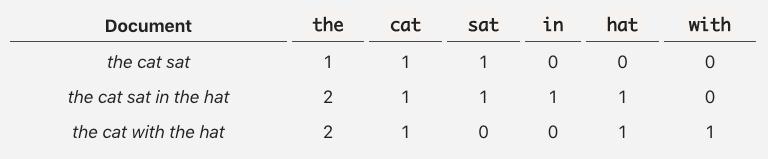


The intuition is that documents are similar if they have similar content. 

In [45]:
#Import data
bow_data = pd.read_csv('csv files/data_for_ML.csv')
bow_data = bow_data.drop(['source','id'], axis=1)
bow_data['type']= bow_data['type'].replace({'human':1, 'machine':0})
bow_data


,completion,type
0,"As you looked back on your journey, you realiz...",0
1,Overpopulation'' The man in the blue suit clic...,1
2,"The once-heroic StableBeluga, now a powerful a...",0
3,". . . . . . She was shaking, i was too, he was...",1
4,"As they sat down on a bench, they reminisced a...",0
...,...,...
9995,The first page came out of the press warm to t...,1
9996,"The first specimen, a human, was amazed at the...",0
9997,Ohmygodohmygodohmygodit's sooooo white in here...,1
9998,"The training was intense and grueling, pushing...",0


In [46]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB

#Vectorize and difine predictor and target value 
vectorizer = CountVectorizer() 
X_bow = vectorizer.fit_transform(bow_data['completion'].values.astype('U'))
y_bow = bow_data['type']

#Split into test and trainig
X_train_bow, X_test_bow, y_train_bow, y_test_bow = train_test_split(X_bow, y_bow, test_size=0.2, random_state=42)

#Define classifier
clf = MultinomialNB() 
#Multinomial Naive Bayes classifier, which is good for e.g. word counts for text classification

#Fit model
model_bow=clf.fit(X_train_bow, y_train_bow)

#Make predictions
y_pred_bow = clf.predict(X_test_bow)

#Get accuracy on the test set
print('model accuracy score: {0:0.4f}'. format(accuracy_score(y_test_bow, y_pred_bow)))
print('model recall score: {0:0.4f}'. format(recall_score(y_test_bow, y_pred_bow)))
print('model precision score: {0:0.4f}'. format(precision_score(y_test_bow, y_pred_bow)))
print('model f1 score: {0:0.4f}'. format(f1_score(y_test_bow, y_pred_bow)))

model accuracy score: 0.9775
model recall score: 0.9899
model precision score: 0.9656
model f1 score: 0.9776


### Sentence embedding model

Sentence embedding refers to a numeric representation of a sentence in the form of a vector of real numbers, which encodes meaningful semantic information. This vector can be used as predictor in a classification task. 
Unlike traditional Bag-of-Words (BoW) representations or one-hot encoding, sentence embeddings capture context, meaning, and relationships between words on a sentence level.

Here i will be using the pretrained SBert (sentence BERT) model, which is state-of-the-art for sentence embedding text classification

In [47]:
#We can get a list with all embeddings here
from sentence_transformers import SentenceTransformer
model = SentenceTransformer('all-MiniLM-L6-v2') #Just the most popular model, a full list can be found:


#Load in data (using the same as in the bow model)
bert_data = bow_data
sentences = bert_data['completion']

#Sentences are encoded by calling model.encode()
sentence_embeddings = model.encode(sentences)

#Print the embeddings
for sentence, embedding in zip(sentences, sentence_embeddings):
    print("Sentence:", sentence)
    print("Embedding:", embedding) 
    print("")

Sentence: As you looked back on your journey, you realized that you had grown and changed in ways you never thought possible. You had become more compassionate, more understanding, and more appreciative of the small things in life. You had also learned to let go of the past and embrace the present, knowing that every moment was a new opportunity for growth and learning. As your free trial of life came to an end, you felt a sense of gratitude for the experiences you had been given. You knew that you would carry these lessons with you for the rest of your existence, and you were excited to see what the future held. You bid farewell to the Earth, knowing that you would return one day, and you continued on your journey, eager to explore the vast expanse of the universe and all the wonders it held. 
Embedding: [ 4.42908145e-02  8.44460726e-02  1.01926908e-01  4.95982468e-02
  1.20850474e-01  4.93089631e-02  7.64580593e-02 -1.27740456e-02
  2.79202946e-02 -3.40267867e-02  2.37356666e-02 -7.0

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



[ 6.21145498e-03  4.43662517e-03 -5.11254743e-03 -9.75950994e-03
 -5.48601970e-02 -1.89753361e-02  1.04162760e-01  5.86976185e-02
 -7.33512193e-02  2.04761382e-02  3.81819606e-02 -2.00507063e-02
  9.75839868e-02  1.76138878e-02 -1.54590113e-02 -2.08855197e-02
  1.10671602e-01 -7.74480775e-02 -8.47390667e-02  7.49550387e-02
 -2.32598260e-02  1.67065188e-02  7.04394951e-02 -1.62787382e-02
  1.26175797e-02 -5.09723416e-03  3.35615054e-02 -1.84435316e-03
 -1.24089971e-01  3.45262028e-02 -6.79504266e-03  1.24662250e-01
 -4.00769860e-02  2.37897467e-02  5.23055755e-02  1.22111827e-01
  4.68794070e-03  1.26566157e-01  2.27089319e-02 -2.00117212e-02
 -2.39066314e-02 -1.17568083e-01  1.26026236e-04  4.95496532e-03
 -1.27637014e-01 -8.56740996e-02  4.19087633e-02  2.91461162e-02
 -2.69236211e-02 -1.43885806e-01 -5.49286976e-02 -1.58300623e-02
  2.00929437e-02 -5.53947268e-03  3.68918180e-02 -2.17112750e-02
  6.75822571e-02  5.61672002e-02 -2.57348665e-03  3.65652107e-02
 -7.26405904e-02  4.87181

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



[-1.55644063e-02  4.55821306e-02  6.54984415e-02  1.20229796e-02
  4.66634296e-02  3.93760018e-03  9.83653590e-02 -1.40075048e-03
  6.83951303e-02 -9.08934548e-02 -2.62112115e-02 -1.64518598e-02
 -9.98786930e-03  2.24875454e-02 -2.90966704e-02 -5.79837570e-03
  3.96444909e-02 -3.49254981e-02 -6.64530843e-02  4.46439870e-02
  3.45576182e-02  2.35379115e-02  6.77567162e-03  2.16536857e-02
 -4.19127680e-02  5.67329600e-02 -7.01030716e-02  2.69822055e-03
 -8.98578465e-02  1.79755818e-02 -2.10897755e-02  1.51879955e-02
  2.31348891e-02  7.51354247e-02  4.61618304e-02  1.18173897e-01
  4.08528335e-02 -3.66040505e-03  4.98548076e-02  1.62835829e-02
 -3.76701802e-02 -6.56932667e-02  1.55024501e-02  2.50788108e-02
  2.00213045e-02  2.31970400e-02 -9.88614094e-03  8.19662120e-03
  4.59214533e-03 -6.46105781e-02  1.19177336e-02  3.55378576e-02
 -3.26748453e-02 -4.04105596e-02 -2.03641299e-02  8.10192376e-02
  2.45747305e-02  3.03178299e-02  1.12976888e-02 -5.22785634e-02
 -2.02857275e-02 -3.54073

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [48]:
#Encode the data 
bert_data['embeddings']= bert_data['completion'].apply(model.encode)
bert_data

#Define x and y
X_bert= bert_data['embeddings'].to_list()
y_bert= bert_data['type'].to_list()

#Split into test and trainig
X_train_bert, X_test_bert, y_train_bert, y_test_bert = train_test_split(X_bert, y_bert, test_size=0.2, stratify=y, random_state=42)

from sklearn.linear_model import LogisticRegression
#Define classifier
clf_bert = LogisticRegression()

#Fit model
model_bert = clf_bert.fit(X_train_bert, y_train_bert)

#Make predictions
y_pred_bert = clf_bert.predict(X_test_bert)

#Get accuracy on the test set
print('model accuracy score: {0:0.4f}'. format(accuracy_score(y_test_bert, y_pred_bert)))
print('model recall score: {0:0.4f}'. format(recall_score(y_test_bert, y_pred_bert)))
print('model precision score: {0:0.4f}'. format(precision_score(y_test_bert, y_pred_bert)))
print('model f1 score: {0:0.4f}'. format(f1_score(y_test_bert, y_pred_bert)))

model accuracy score: 0.9655
model recall score: 0.9690
model precision score: 0.9623
model f1 score: 0.9656
